# Document Processing
This notebook is created after the inputs from Prof. Aptoula regarding trying out the dilation with horizontal SE at different angles technique:

> Instead of using FT, use dilation with a horizontal SE at different angles and compare the **white pixel sum** of the results to better find the alignment of the image and rotate.

## Summary of the Notebook
1. Convert PDF to image
2. Apply processing techniques
3. Replace the Fourier Transform (FT) with the above-mentioned technique for "white pixel sum" comparison

---

## **Roadmap: Feature-Based Detection Approach**

1. **Morphological Operations (Opening + Closing)**
   - **Why:** Clean noise and small gaps in the image before skew correction.
   - **When:** Immediately after binarization.

2. **New Skew Correction**
   - **Why:** Correct for slanted paragraphs based on text texture.
   - **When:** After morphological operations.

3. **Gap Detection Between Blobs**
   - **Why:** Define paragraphs based on the gaps between them.
   - **When:** After skew correction.

4. **Connected Component Analysis (CCA)**
   - **Why:** Use CCA to finalize paragraph detection after skew correction.
   - **When:** After gap detection.

5. **Bounding Box Extraction**
   - **Why:** Same as above, used to segment and realign blobs individually.
   - **When:** After CCA.

---

## Some Installations

In [ ]:
# install the pdf2image library if needed
!pip install pdf2image

In [ ]:
# to make the `convert_from_path` work and
# ... to avoid the 'Is poppler installed...' error
!apt-get install poppler-utils # Install poppler on linux systems

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.8).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


---

## Moving to Actual Code

In [ ]:
from pdf2image import convert_from_path
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Color Filtering
Let's get rid of the blue shapes in the image. The idea is from _Automatic CNN..._ by Can et. al.

- First, we have to identify the average RGB of the blue shapes, either manually or through code.
- Then, we apply the blue color filter to get rid of said pixels.

## Manually Obtained Colors
These colors were obtained manually by eyedropping on the image. They can be changed.

- dark blue: `#484BB5`
- light blue: `#7374BF`

---

### Previously

```python
# Load the image
original_image = cv2.imread('./content/img.jpg')

# Create a copy to modify
filtered_image = original_image.copy()

# ...
```

### Now:
1. PDF to Image Conversion
2. Library Used: pdf2image to convert the PDF to high-quality images.
3. Reason: Ensures minimal information loss when processing the document.
4. Code: Extracts the first page of the PDF as an image.

In [ ]:
# --- Getting Input from PDF ---

# Load the PDF and convert to image (assuming first page for now)
pdf_path = '/content/usk_0001_0033.pdf'  # Update the path to your PDF
pages = convert_from_path(pdf_path, dpi=300)  # High DPI for minimal information loss

# Convert the first page to a NumPy array
original_image = np.array(pages[0])[:, :, ::-1]  # Convert PIL image to BGR (OpenCV format)

# Create a copy to modify
filtered_image = original_image.copy()

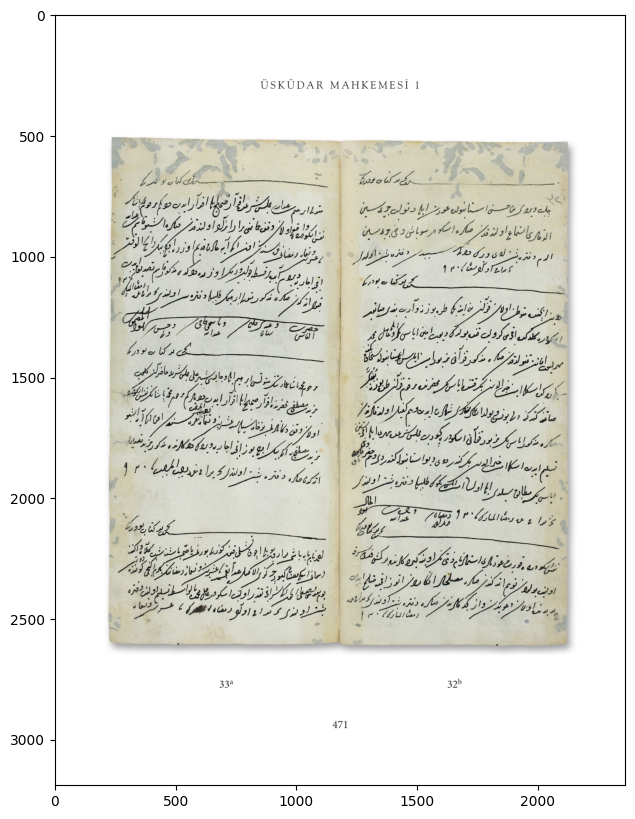

In [ ]:
# visualize the image with a plot
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('on')
plt.show()

In [ ]:
original_image.shape

(3189, 2363, 3)

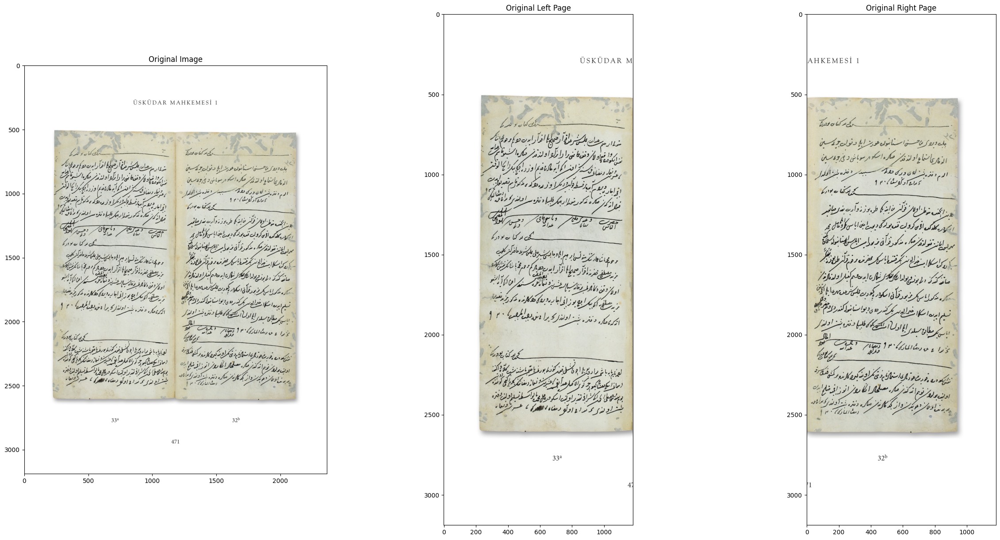

In [ ]:
# Split the cropped image into left and right halves
height, width, num_of_channels = original_image.shape
original_left_half = original_image[:, :width // 2]
original_right_half = original_image[:, width // 2:]

plt.figure(figsize=(30, 15))

# Display the original image
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.title("Original Left Page")
plt.imshow(cv2.cvtColor(original_left_half, cv2.COLOR_BGR2RGB))
plt.axis("on")

plt.subplot(1, 3, 3)
plt.title("Original Right Page")
plt.imshow(cv2.cvtColor(original_right_half, cv2.COLOR_BGR2RGB))
plt.axis("on")
plt.show()


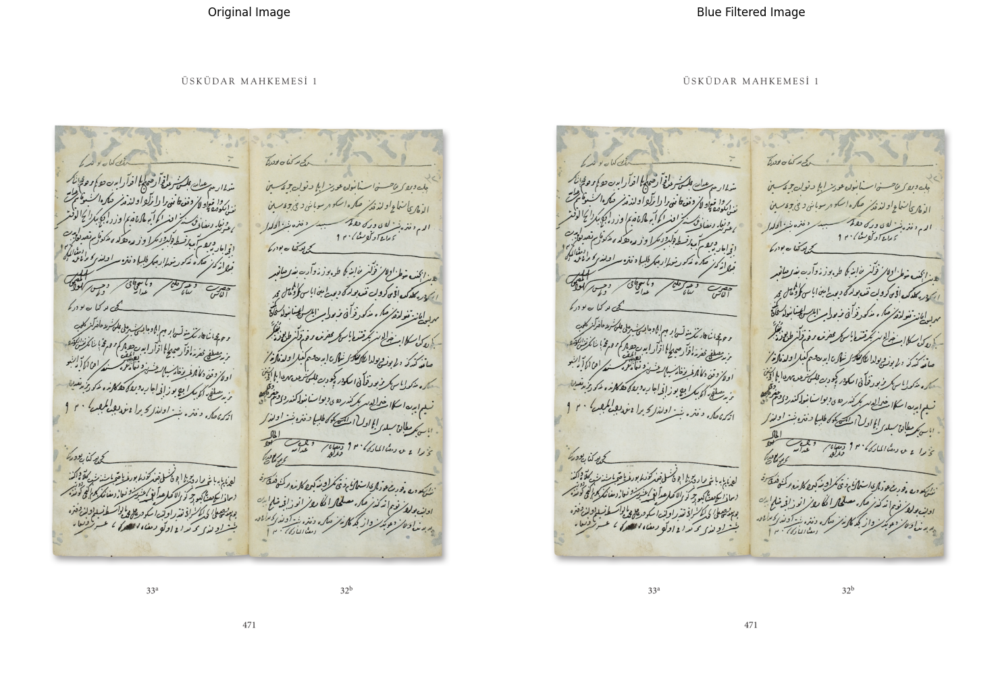

In [ ]:
"""
MOST IMPORTANT PART RIGHT HERE!!!
    |
    |
    V
"""

# Convert the image to HSV color space
hsv = cv2.cvtColor(original_image, cv2.COLOR_BGR2HSV)

"""
    A
    |
    |
MOST IMPORTANT PART RIGHT HERE!!!
"""

# Define HSV ranges for blue color (adjusted by trial and error)
lower_blue = np.array([100, 50, 50])  # Lower bound for blue in HSV
upper_blue = np.array([140, 255, 255])  # Upper bound for blue in HSV

# Create a mask for blue pixels
blue_mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Set the blue areas to white in the filtered image
filtered_image[blue_mask != 0] = [255, 255, 255]

# Plot the original and the filtered images
plt.figure(figsize=(15, 10))

# Display the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Display the filtered image
plt.subplot(1, 2, 2)
plt.title('Blue Filtered Image')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

## Red Filter
Let's now get rid of the red numerals on the side of the page for a cleaner document to process.

The two red colors were eyedropped manually. **In case needed**, change these for better results!
- dark red: #B7888D
- light red: #CEA6A7

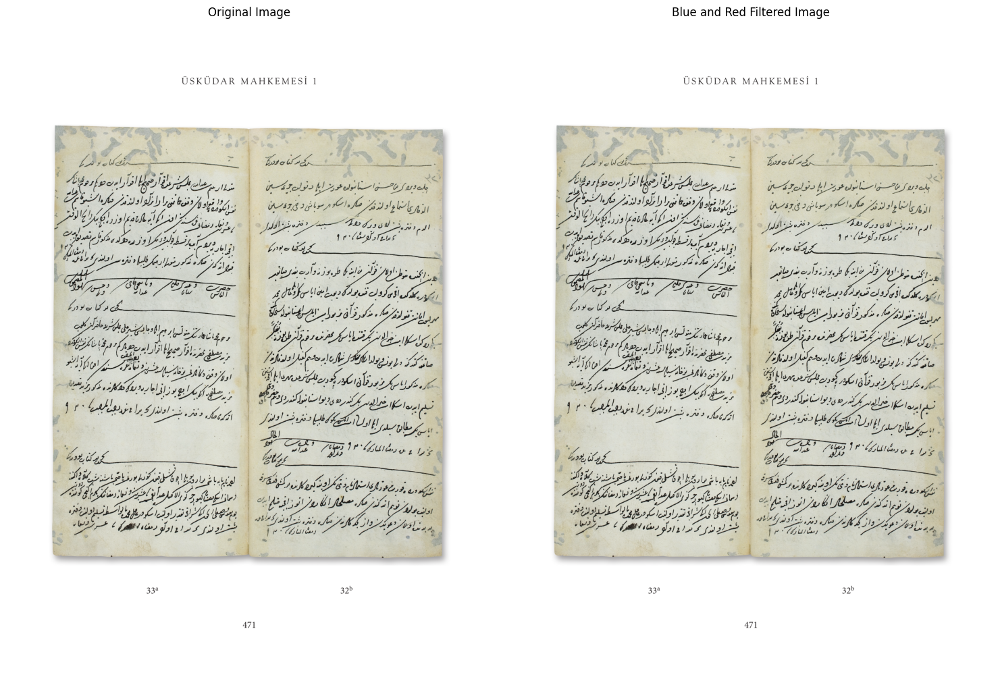

In [ ]:
# Convert the already blue-filtered image to HSV color space
hsv_filtered_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2HSV)

# Convert the RGB values for the new red colors to HSV
new_lower_red_rgb = np.array([183, 136, 141])  # #B7888D
new_upper_red_rgb = np.array([206, 166, 167])  # #CEA6A7

# Convert the new RGB values to HSV
new_lower_red_hsv = cv2.cvtColor(np.uint8([[new_lower_red_rgb]]), cv2.COLOR_RGB2HSV)[0][0]
new_upper_red_hsv = cv2.cvtColor(np.uint8([[new_upper_red_rgb]]), cv2.COLOR_RGB2HSV)[0][0]

# Create a mask for the new red pixels
red_mask = cv2.inRange(hsv_filtered_image, new_lower_red_hsv, new_upper_red_hsv)

# Set the red areas to white in the filtered image
filtered_image[red_mask != 0] = [255, 255, 255]

# Plot the original and the final filtered images
plt.figure(figsize=(15, 10))

# Display the original image with only blue filtered
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Display the final image with both blue and red filtered
plt.subplot(1, 2, 2)
plt.title('Blue and Red Filtered Image')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

## Gray Smudges
As we can see, there are certain gray smudges around the edges of the pages. Let's filter those.

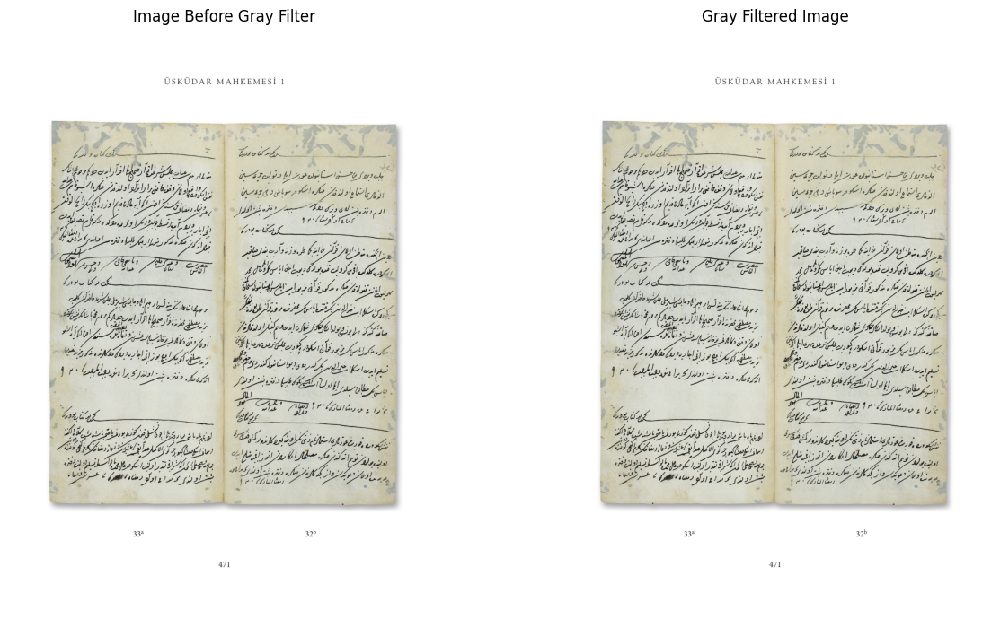

In [ ]:
# Convert the already blue and (if applicable) red filtered image to HSV color space
hsv_filtered_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2HSV)

# Convert the RGB values for the dark and light gray smudges to HSV
dark_gray_rgb = np.array([175, 178, 169])  # #AFB2A9
light_gray_rgb = np.array([187, 190, 180])  # #BBBEB4

# Convert the RGB values to HSV
dark_gray_hsv = cv2.cvtColor(np.uint8([[dark_gray_rgb]]), cv2.COLOR_RGB2HSV)[0][0]
light_gray_hsv = cv2.cvtColor(np.uint8([[light_gray_rgb]]), cv2.COLOR_RGB2HSV)[0][0]

# Create a mask for the gray pixels
gray_mask = cv2.inRange(hsv_filtered_image, dark_gray_hsv, light_gray_hsv)

# Set the gray areas to white in the filtered image
filtered_image[gray_mask != 0] = [255, 255, 255]

# Plot the original and the final filtered images
plt.figure(figsize=(13, 7))

# Display the image after red filtering (if done earlier)
plt.subplot(1, 2, 1)
plt.title('Image Before Gray Filter')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Display the image after gray filtering
plt.subplot(1, 2, 2)
plt.title('Gray Filtered Image')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

I guess not much change can be seen.

# Binarization
The workflow below for turning the filtered image into a binary image:
1. convert to grayscale
2. apply Gaussian blur
3. Otsu's thresholding
4. binary inversion (optional since foreground should be black text with white background)

---

## Note
This verion will incorporate **Adaptive Otsu Thresholding** after the suggestion of Prof. Aptoula regarding the binarization process.

The previous code was:

```python
# Convert the filtered image to grayscale
gray_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to the grayscale image
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Apply Otsu's thresholding to get a binary image
_, binary_image = cv2.threshold(blurred_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

```

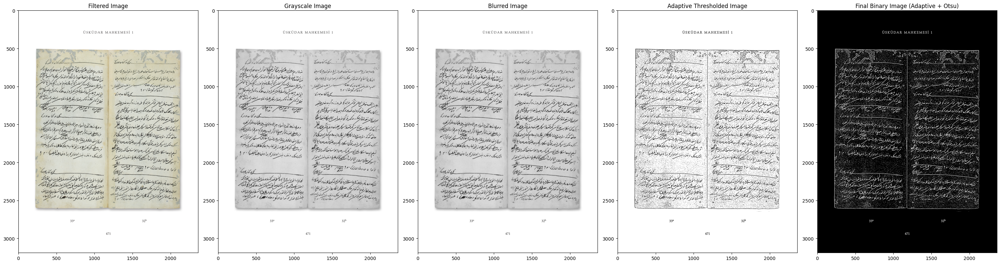

In [ ]:
# Convert the filtered image to grayscale
gray_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to the grayscale image
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Step 1: Apply adaptive thresholding (mean or Gaussian methods)
adaptive_binary_image = cv2.adaptiveThreshold(
    blurred_image,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # Use Gaussian weighted sum for adaptive thresholding
    cv2.THRESH_BINARY,
    11,  # Block size (neighborhood size)
    2    # Constant subtracted from mean
)

# Step 2: Combine with Otsu's thresholding for further refinement
_, otsu_binary_image = cv2.threshold(
    adaptive_binary_image,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# (Optional) Invert the binary image if the text is white on a black background
otsu_binary_image = cv2.bitwise_not(otsu_binary_image)

# Plot the results to compare
plt.figure(figsize=(30, 15))

# Display the original filtered image
plt.subplot(1, 5, 1)
plt.title('Filtered Image')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('on')

# Display the grayscale image
plt.subplot(1, 5, 2)
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.axis('on')

# Display the blurred image
plt.subplot(1, 5, 3)
plt.title('Blurred Image')
plt.imshow(blurred_image, cmap='gray')
plt.axis('on')

# Display the adaptive thresholded image
plt.subplot(1, 5, 4)
plt.title('Adaptive Thresholded Image')
plt.imshow(adaptive_binary_image, cmap='gray')
plt.axis('on')

# Display the final binary image after Otsu refinement
plt.subplot(1, 5, 5)
plt.title('Final Binary Image (Adaptive + Otsu)')
plt.imshow(otsu_binary_image, cmap='gray')
plt.axis('on')

plt.tight_layout()
plt.show()

### Key Adjustments
1. Adaptive Thresholding: Uses cv2.adaptiveThreshold() with a Gaussian weighting function. The parameters `(11, 2)` denote a neighborhood size of $11 \times 11$ and a constant $2$ subtracted from the mean for better contrast.

2. Otsu's Refinement: Combines global Otsu's method with the adaptively thresholded image for fine-tuned binarization.

3. Inversion:
Maintains flexibility to invert the binary image depending on your requirements (e.g., black text on white background).


## Initial Observation
To be honest, the adaptive Otsu thresholding result does NOT look promising. Too much noise I guess. Let's try something else.

## Can we remove the white noise?

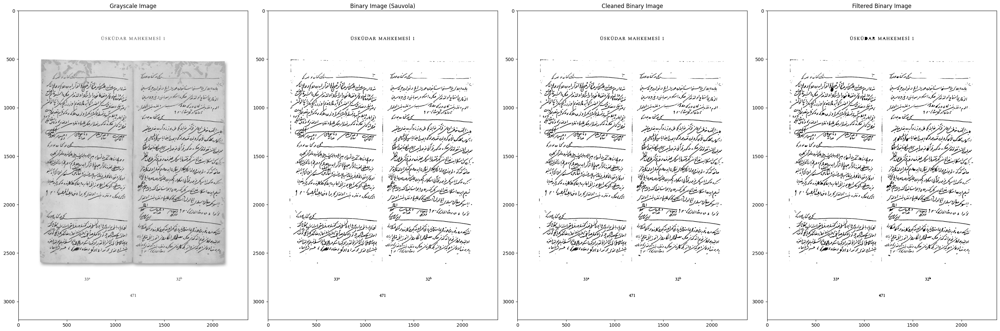

In [ ]:
# Convert the filtered image to grayscale
gray_image = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to the grayscale image to smooth minor noise
blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

# Step 1: Binarization using Sauvola's thresholding
from skimage.filters import threshold_sauvola

window_size = 25  # Size of the local neighborhood
sauvola_thresh = threshold_sauvola(blurred_image, window_size=window_size)
binary_image = (blurred_image > sauvola_thresh).astype(np.uint8) * 255

# Step 2: Morphological operations to remove small noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

# Perform opening (erosion followed by dilation) to remove small noise
binary_image_cleaned = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

# Step 3: Remove small blobs using connected component analysis
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_image_cleaned, connectivity=8)

# Filter out small components based on area
min_area = 500  # Adjust based on noise size
filtered_binary_image = np.zeros_like(binary_image_cleaned)
for i in range(1, num_labels):  # Skip the background
    if stats[i, cv2.CC_STAT_AREA] >= min_area:
        filtered_binary_image[labels == i] = 255

# Plot the results to compare
plt.figure(figsize=(30, 15))

# Display the original grayscale image
plt.subplot(1, 4, 1)
plt.title('Grayscale Image')
plt.imshow(gray_image, cmap='gray')
plt.axis('on')

# Display the binary image after Sauvola thresholding
plt.subplot(1, 4, 2)
plt.title('Binary Image (Sauvola)')
plt.imshow(binary_image, cmap='gray')
plt.axis('on')

# Display the cleaned binary image (morphological operations)
plt.subplot(1, 4, 3)
plt.title('Cleaned Binary Image')
plt.imshow(binary_image_cleaned, cmap='gray')
plt.axis('on')

# Display the final filtered image after connected components
plt.subplot(1, 4, 4)
plt.title('Filtered Binary Image')
plt.imshow(filtered_binary_image, cmap='gray')
plt.axis('on')

plt.tight_layout()
plt.show()


## Observation
This is way better than what we had.

### Note
We should make sure that what we pass downstream must have black background and white foreground. It's currently the inverse of that.

## Padding Removal
1. inverted `filtered_binary_image` to have a white foreground and black background.
2. removed padding by detecting the first and last rows/columns that contain text.

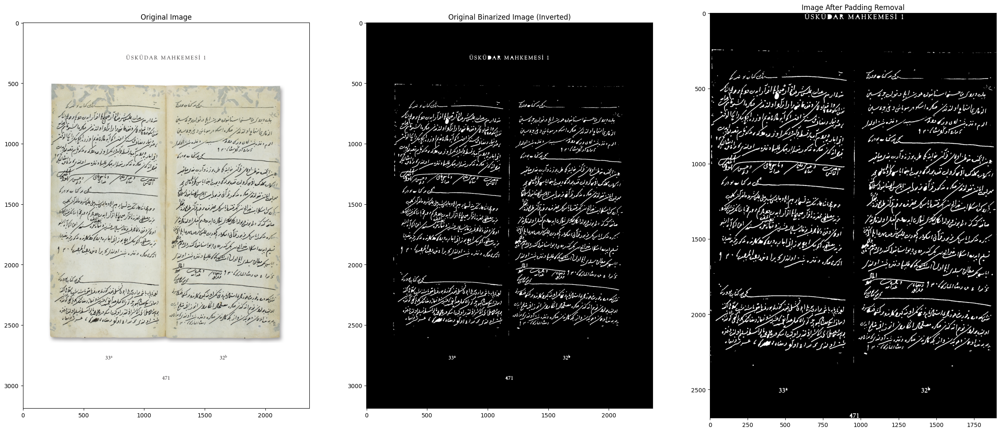

In [ ]:
# Invert image: white foreground and black background
binary_image_inverted = cv2.bitwise_not(filtered_binary_image)

# Remove padding: detect rows and columns with text
rows = np.any(binary_image_inverted, axis=1)
cols = np.any(binary_image_inverted, axis=0)
top, bottom = np.where(rows)[0][[0, -1]]
left, right = np.where(cols)[0][[0, -1]]

# Crop the image to remove padding
cropped_image = binary_image_inverted[top:bottom + 1, left:right + 1]

plt.figure(figsize=(30, 15))

# Display the original image
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.title("Original Binarized Image (Inverted)")
plt.imshow(binary_image_inverted, cmap="gray")
plt.axis("on")

plt.subplot(1, 3, 3)
plt.title("Image After Padding Removal")
plt.imshow(cropped_image, cmap="gray")
plt.axis("on")
plt.show()


## Split into Halves
Get left and right pages separately.

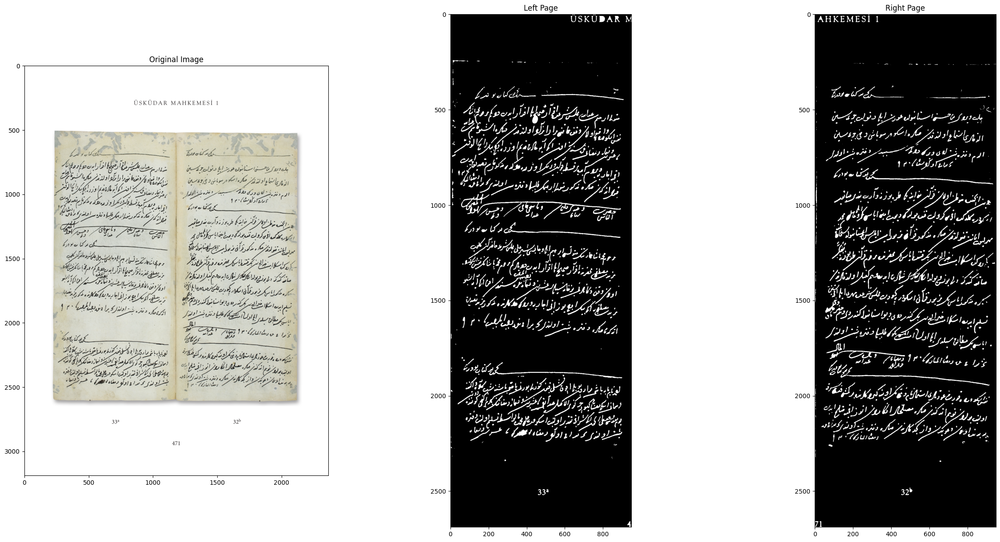

In [ ]:
# Split the cropped image into left and right halves
height, width = cropped_image.shape
left_half = cropped_image[:, :width // 2]
right_half = cropped_image[:, width // 2:]

plt.figure(figsize=(30, 15))

# Display the original image
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.title("Left Page")
plt.imshow(left_half, cmap="gray")
plt.axis("on")

plt.subplot(1, 3, 3)
plt.title("Right Page")
plt.imshow(right_half, cmap="gray")
plt.axis("on")
plt.show()


## Morph Ops
Apply opening and closing with adjustable kernel sizes.

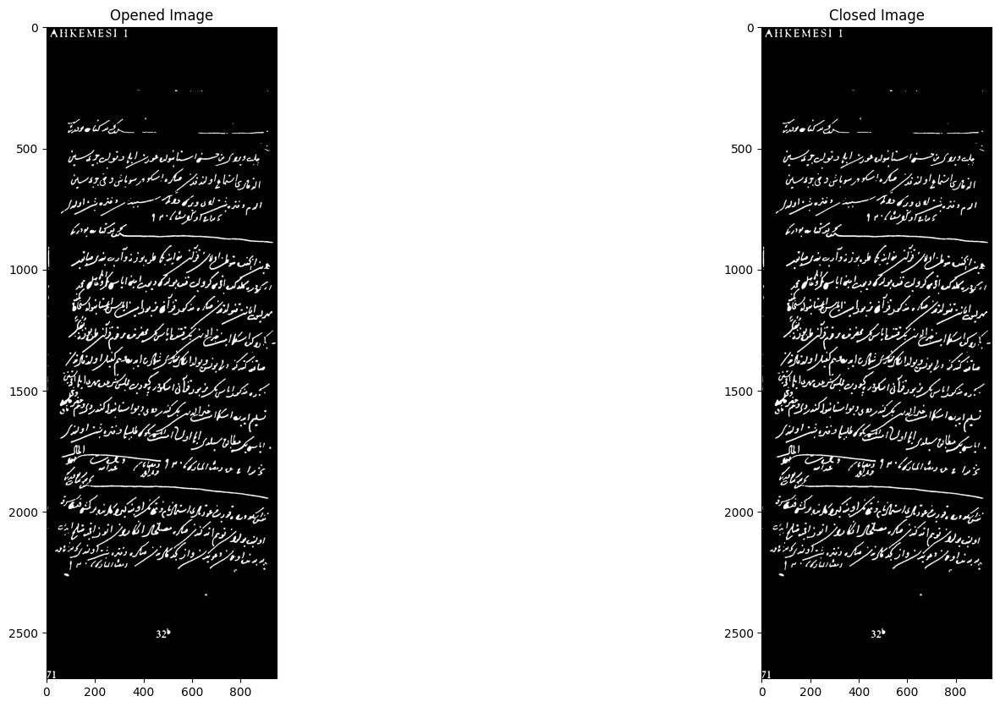

In [ ]:
# Define the kernel for morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

# Perform opening and closing
opened_image = cv2.morphologyEx(right_half, cv2.MORPH_OPEN, kernel)
closed_image = cv2.morphologyEx(opened_image, cv2.MORPH_CLOSE, kernel)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Opened Image")
plt.imshow(opened_image, cmap="gray")
plt.axis("on")

plt.subplot(1, 2, 2)
plt.title("Closed Image")
plt.imshow(closed_image, cmap="gray")
plt.axis("on")
plt.show()


## **NEW** Skew Correction
This time, without Fourier Transform, but with horizontal SE with varying angles to detect the dominant direction for rotation.

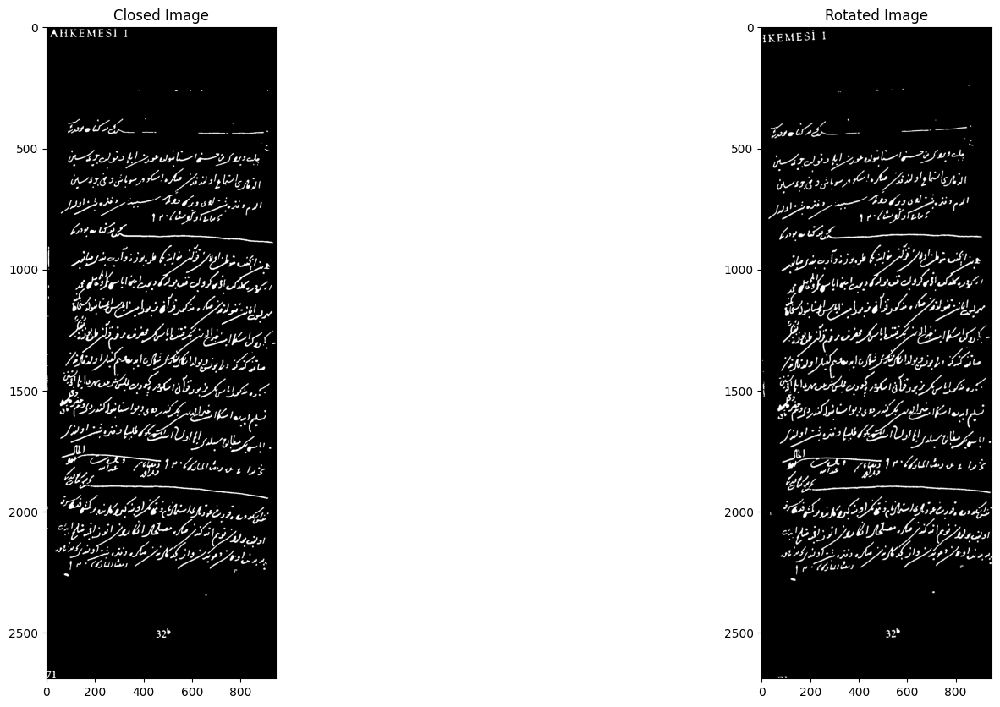

In [ ]:
# Create a horizontal structuring element (SE)
angles = range(-10, 11, 1)  # Check angles from -10 to +10 degrees
best_angle = 0
max_response = 0

for angle in angles:
    M = cv2.getRotationMatrix2D((closed_image.shape[1] / 2, closed_image.shape[0] / 2), angle, 1)
    rotated = cv2.warpAffine(closed_image, M, (closed_image.shape[1], closed_image.shape[0]),
                             flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    horizontal_projection = np.sum(rotated, axis=1)
    response = np.var(horizontal_projection)
    if response > max_response:
        max_response = response
        best_angle = angle

# Apply the best rotation
M = cv2.getRotationMatrix2D((closed_image.shape[1] / 2, closed_image.shape[0] / 2), best_angle, 1)
rotated_image = cv2.warpAffine(closed_image, M, (closed_image.shape[1], closed_image.shape[0]),
                               flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Closed Image")
plt.imshow(closed_image, cmap="gray")
plt.axis("on")

plt.subplot(1, 2, 2)
plt.title("Rotated Image")
plt.imshow(rotated_image, cmap="gray")
plt.axis("on")
plt.show()


## [DON'T RUN] Gap Detection
Unchanged from last time

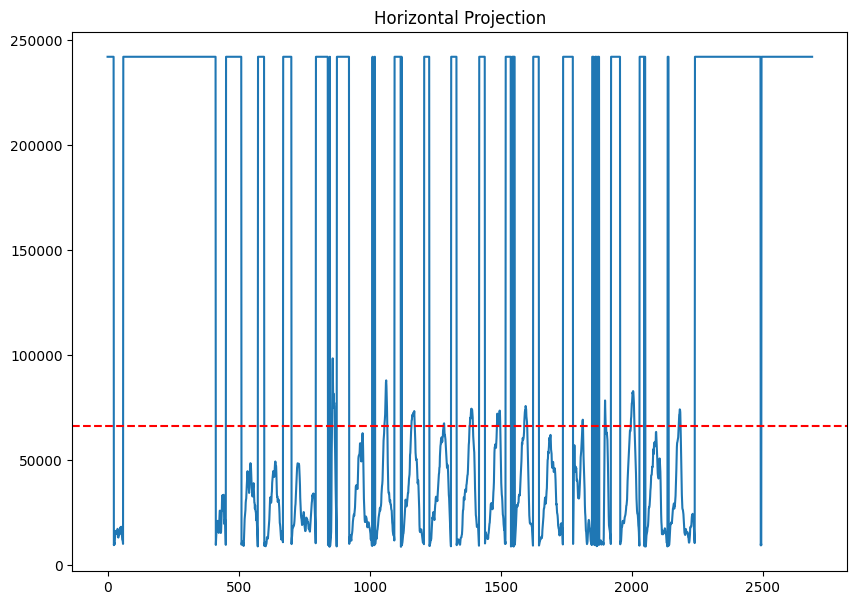

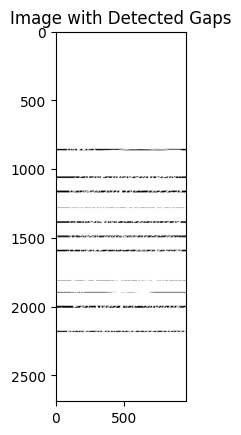

In [ ]:
# Invert the binary image (background becomes black, text becomes white)
# inverted_image = cv2.bitwise_not(rotated_image)

# no need to invert anymore, it's already inverted (black BG and white FG)
inverted_image = rotated_image

# Use horizontal projection to detect gaps between blobs
horizontal_sum = np.sum(inverted_image, axis=1)
gap_threshold = np.mean(horizontal_sum) / 2  # Define a threshold for gaps

plt.figure(figsize=(10, 7))

# Plot the horizontal projection (optional, for visual analysis)
# plt.subplot(1, 2, 1)
plt.plot(horizontal_sum)
plt.axhline(y=gap_threshold, color='r', linestyle='--')  # Visualize the threshold
plt.title('Horizontal Projection')
plt.show()

# Find the gaps between blobs
gaps = np.where(horizontal_sum < gap_threshold)[0]

# [OPTIONAL] Just for visualization — DO NOT MODIFY `rotated_image` used for CCA
gap_overlay = rotated_image.copy()
for gap in gaps:
    cv2.line(gap_overlay, (0, gap), (gap_overlay.shape[1], gap), 255, 1)

# For visualization only
plt.title('Image with Detected Gaps')
plt.imshow(gap_overlay, cmap='gray')
plt.axis('on')
plt.show()


# # Display result after gap detection (optional)
# for gap in gaps:
#     cv2.line(rotated_image, (0, gap), (rotated_image.shape[1], gap), (255, 0, 0), 1)



# # plt.subplot(1, 2, 2)
# plt.title('Image with Detected Gaps')
# plt.imshow(rotated_image, cmap='gray')
# plt.axis('on')
# plt.show()

## Connected Component Analysis (CCA)
Unchanged, and, the rotated image has correct polarity.

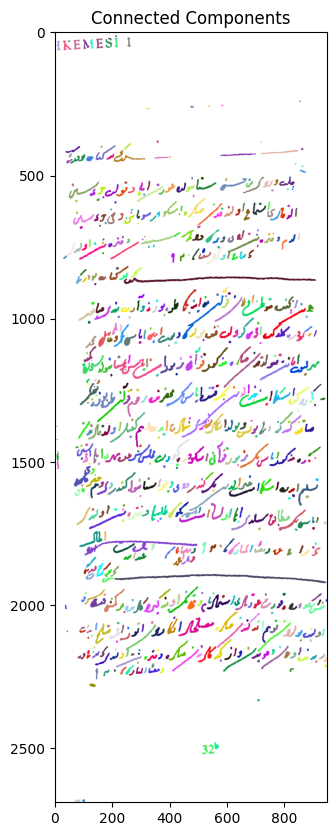

In [ ]:
# Perform connected component analysis
# this time, the `rotate_image` has correct polarity
num_labels, labels_im = cv2.connectedComponents(rotated_image)

background_color = [255, 255, 255]  # White

# Color the components for visualization
colored_labels = np.full((*rotated_image.shape, 3), background_color, dtype=np.uint8)

for i in range(1, num_labels):  # Start from 1 to skip the background
    mask = labels_im == i
    colored_labels[mask] = np.random.randint(0, 255, size=(3,))

# Display the connected components
plt.figure(figsize=(20, 10))
plt.title('Connected Components')
plt.imshow(colored_labels)
plt.axis('on')
plt.show()

### Attempt 2 at Coloring Connected Components

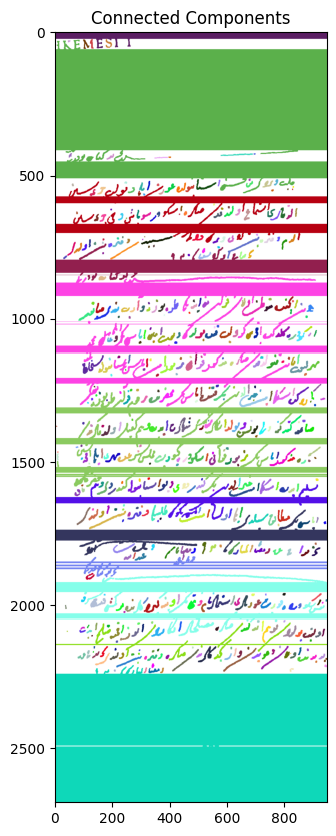

In [ ]:
# Assuming rotated_image is your binary image

# Perform connected component analysis
num_labels, labels_im = cv2.connectedComponents(rotated_image)

# Define the background label (usually 0)
background_label = 0

# Choose the desired background color (e.g., white [255, 255, 255] or black [0, 0, 0])
background_color = [255, 255, 255]  # White background

# Create a colored labels image with the background initialized to the desired color
colored_labels = np.full((*rotated_image.shape, 3), background_color, dtype=np.uint8)

# Color the connected components (words)
for i in range(1, num_labels):  # Start from 1 to skip the background
    mask = labels_im == i
    colored_labels[mask] = np.random.randint(0, 255, size=(3,))  # Assign random color

# Display the connected components
plt.figure(figsize=(20, 10))
plt.title('Connected Components')
plt.imshow(colored_labels)
plt.axis('on')
plt.show()

## Bounding Box Extraction
Now saves the box info to JSON

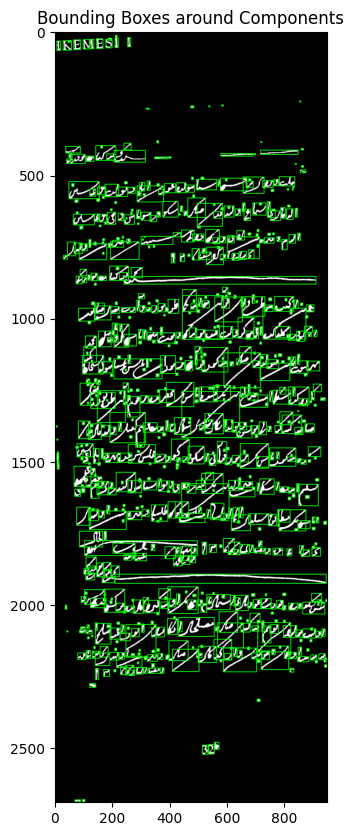

In [ ]:
import json

# Find contours and extract bounding boxes
contours, _ = cv2.findContours(rotated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bounding_boxes = []

# Draw bounding boxes and store their information
bounding_image = cv2.cvtColor(rotated_image, cv2.COLOR_GRAY2BGR)
for idx, contour in enumerate(contours):
    x, y, w, h = cv2.boundingRect(contour)
    bounding_boxes.append({"index": idx, "x": x, "y": y, "width": w, "height": h})
    cv2.rectangle(bounding_image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Save bounding boxes to JSON file
with open("bounding_boxes.json", "w") as f:
    json.dump(bounding_boxes, f, indent=4)

# Display bounding boxes
plt.figure(figsize=(20, 10))
plt.title("Bounding Boxes around Components")
plt.imshow(bounding_image)
plt.axis("on")
plt.show()

## Final Comparison

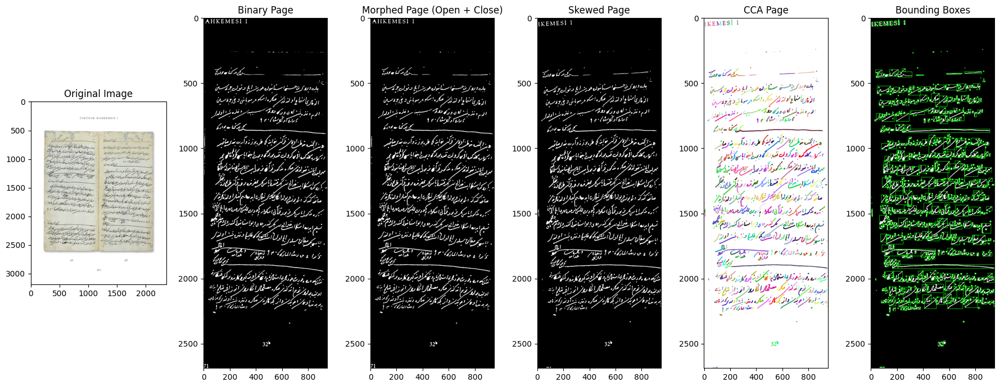

In [ ]:
# Display the result
plt.figure(figsize=(18, 7))

plt.subplot(1, 6, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 6, 2)
plt.imshow(right_half, cmap='gray')
plt.title("Binary Page")
plt.axis('on')

plt.subplot(1, 6, 3)
plt.imshow(closed_image, cmap='gray')
plt.title("Morphed Page (Open + Close)")
plt.axis('on')

plt.subplot(1, 6, 4)
plt.imshow(rotated_image, cmap='gray')
plt.title(f"Skewed Page")
plt.axis('on')

plt.subplot(1, 6, 5)
plt.imshow(colored_labels, cmap='gray')
plt.title(f"CCA Page")
plt.axis('on')

plt.subplot(1, 6, 6)
plt.imshow(bounding_image, cmap='gray')
plt.title(f"Bounding Boxes")
plt.axis('on')

plt.tight_layout()
plt.show()

---

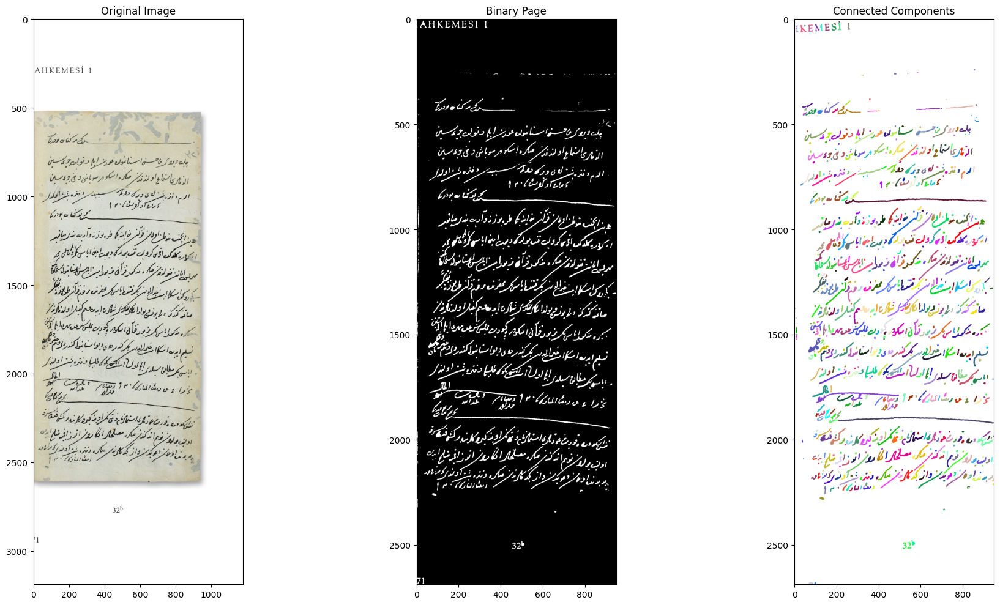

In [ ]:
# put original right page , binary page and cca page next to each other
# Display the result
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_right_half, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.imshow(right_half, cmap='gray')
plt.title("Binary Page")
plt.axis('on')

plt.subplot(1, 3, 3)
plt.imshow(colored_labels, cmap='gray')
plt.title(f"Connected Components")
plt.axis('on')

plt.tight_layout()
plt.show()

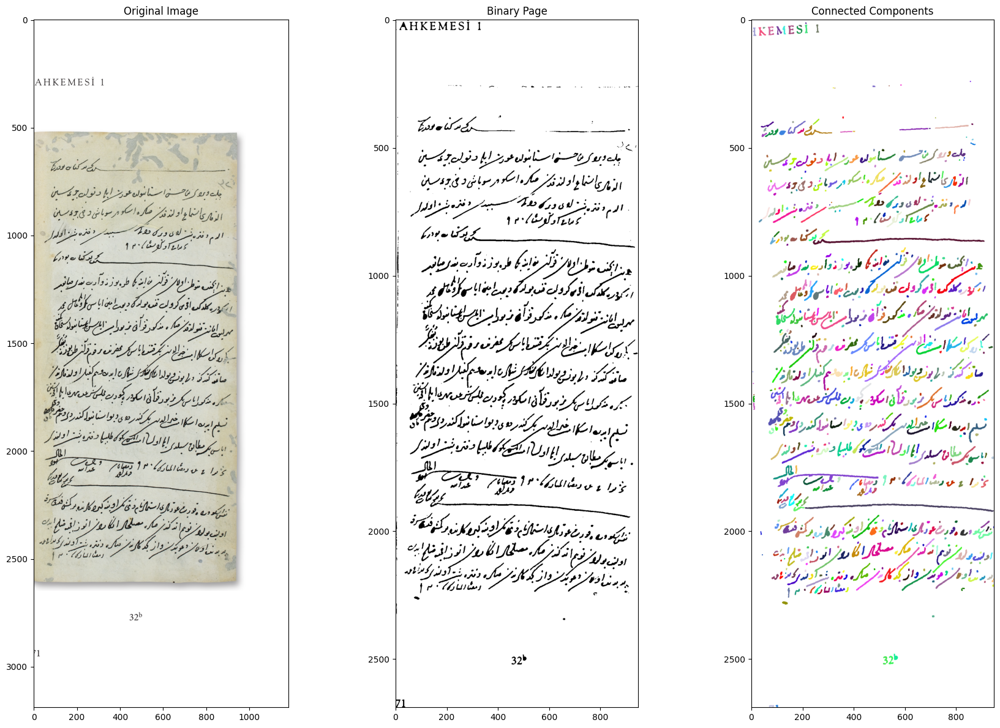

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Assuming original_right_half, right_half, and colored_labels are already loaded

# put original right page , binary page and cca page next to each other
# Display the result
plt.figure(figsize=(18, 12))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(original_right_half, cv2.COLOR_BGR2RGB))
plt.axis('on')

plt.subplot(1, 3, 2)
plt.imshow(right_half, cmap='gray_r')
plt.title("Binary Page")
plt.axis('on')

plt.subplot(1, 3, 3)
plt.imshow(colored_labels, cmap='gray_r')
plt.title(f"Connected Components")
plt.axis('on')

plt.tight_layout()
plt.show()

Figure saved as figure.png with 300 DPI.
Figure saved as figure.pdf with 300 DPI.


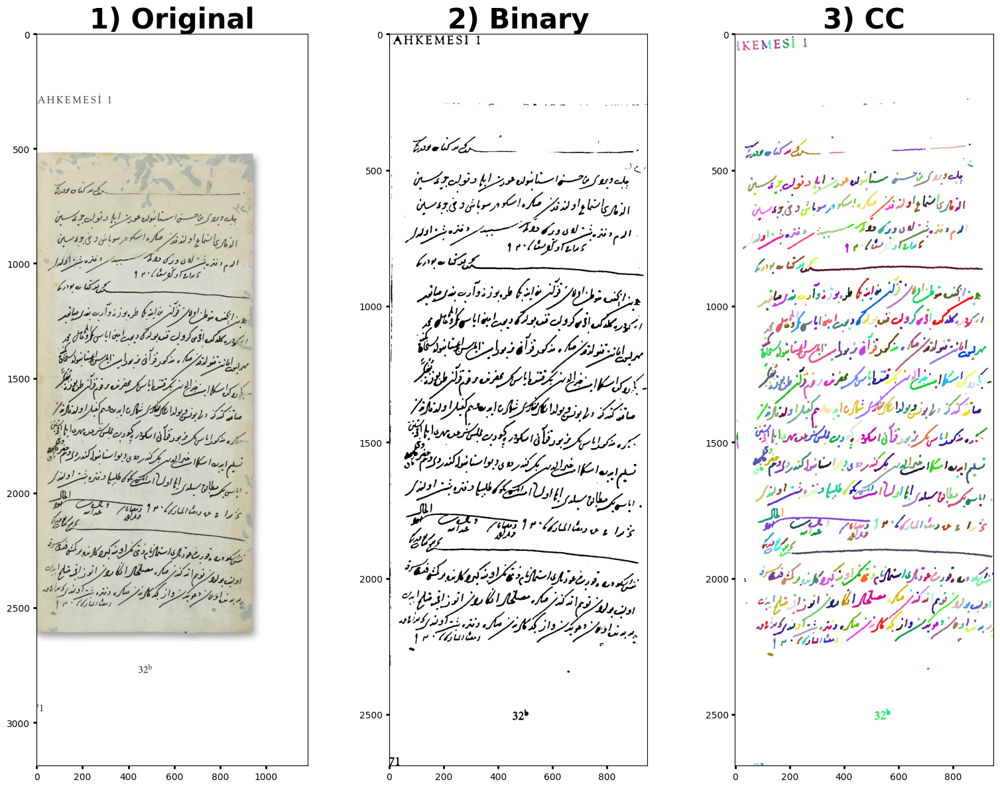

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Assuming original_right_half, right_half, and colored_labels are already loaded

# Define the font dictionary for titles
title_font = {'fontsize': 30,  # Adjust the size as needed
              'fontweight': 'bold'}

# put original right page , binary page and cca page next to each other
# Display the result
plt.figure(figsize=(16, 12))

plt.subplot(1, 3, 1)
plt.title("1) Original", fontdict=title_font)
plt.imshow(cv2.cvtColor(original_right_half, cv2.COLOR_BGR2RGB))
plt.axis('on')
plt.tick_params(axis='both', which='major', width=2)  # Make major ticks thicker

plt.subplot(1, 3, 2)
plt.imshow(right_half, cmap='gray_r')
plt.title("2) Binary", fontdict=title_font)
plt.axis('on')
plt.tick_params(axis='both', which='major', width=2)  # Make major ticks thicker

plt.subplot(1, 3, 3)
plt.imshow(colored_labels, cmap='gray_r')
plt.title("3) CC", fontdict=title_font)
plt.axis('on')
plt.tick_params(axis='both', which='major', width=2)  # Make major ticks thicker

plt.tight_layout()

# Save as PNG
plt.savefig('origin_binary_cc_figure2.png', dpi=300, bbox_inches='tight')
print("Figure saved as figure.png with 300 DPI.")

# Save as PDF with 300 DPI
plt.savefig('origin_binary_cc_figure2.pdf', dpi=300, bbox_inches='tight')
print("Figure saved as figure.pdf with 300 DPI.")

plt.show()

---